In [1]:

import pickle
import time
import logging
import numpy as np
import extra_data as ed
import tifffile as tif
from copy import copy
import os
from scipy import optimize
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
from scipy.optimize import least_squares
from scipy.optimize import curve_fit
from scipy import ndimage

import cv2

import matplotlib.pyplot as plt
from skimage import transform

import matplotlib.style
import matplotlib as mpl
mpl.style.use('classic')
plt.rcParams['text.usetex'] = True

%config InlineBackend.figure_format='retina'

In [2]:


def writeIM2tif(filename, data):
    tif.imsave(filename + '.tif', data)

In [3]:
def genLVpair(StCamID, SweepSpeed, run):
    trainIDs = run.train_ids
    first_train = trainIDs[0]
    last_train = trainIDs[-1]
    num_trains = len(trainIDs)

    # Get sources present in run (used to check if DiPOLE is in shot mode)
    sources = run.all_sources
    rundata = run[f'HED_SYDOR_TEST/CAM/{StCamID}:daqOutput']
    
    # create mask where no data exists
    mask = run[f'HED_SYDOR_TEST/CAM/{StCamID}:daqOutput', 'data.image.pixels'].data_counts() != 0
    
    # get all indexes where data exists on streak camera
    indexes = mask.to_numpy().nonzero()+first_train
    indexes_count = indexes.shape[1]
    
    # IF NO TRAIN IDs WITH DATA, NO VISAR DATA PRESENT
    # LOGGING.CRITICAL
    if indexes_count == 0:
        msg = f'No train IDs with data found for run {run_id}, camera {cam_name}'
        logging.exception(SystemError(msg))
        return None, None
        
    # Check if DIPOLE_PPU_OPEN exists (shot mode)
    source_string = 'HED_HPLAS_HET/SWITCH/DIPOLE_PPU_OPEN'

    if source_string in sources:
        logging.debug(f"{source_string} is present in the run")
        sourcedata = run['HED_HPLAS_HET/SWITCH/DIPOLE_PPU_OPEN']
        # find out which train was obtained when DIPOLE_PPU_OPEN (value in PPU not equal to value of first train)
        index_check = []
        for i in range(num_trains):
            closed_value = sourcedata['hardwareStatusBitField.value'].train_from_id(first_train)[1]
            #logging.debug(f"Closed value for DIPOLE_PPU_OPEN: {closed_value}")
            tmp = sourcedata['hardwareStatusBitField.value'].train_from_id(first_train+i)[1]
            if tmp != closed_value:
                index_check.append(int(first_train+i))
                logging.debug(f'Train in : {int(first_train+i)}, {tmp}')
        logging.debug(f"Trains with PPU open: {len(index_check)}")
        if len(index_check) > 0:
            matching_value = np.intersect1d(indexes, index_check)  # get the common element between the two arrays
            logging.debug(f'Found train: {matching_value} where DIPOLE_PPU_OPEN')
            matching_index = np.where(indexes[0] == matching_value)[0][0]  # get the index of the matching element in 'indexes'
            logging.info(f'Found index:{matching_index} where train_id obtained during DIPOLE_PPU_OPEN')
        else:
            logging.critical(f"{source_string} remained closed during run.")
            matching_index = 1
    else:
        logging.debug(f"{source_string} is not present in the run")
        # set second index (= 1) as train_id
        matching_index = 1

    # load reference data from 1st train with data (index 0)
    train_id_ref = indexes[0][0]
    train_id = indexes[0][matching_index]
    
    ref_img_raw = np.array(rundata['data.image.pixels'].train_from_id(train_id_ref)[1]) #pick first trainID with data for reference image
    img_raw = np.array(rundata['data.image.pixels'].train_from_id(train_id)[1])
    refScaleFacs = [np.min(ref_img_raw), np.max(ref_img_raw)]
    datScaleFacs = [np.min(img_raw), np.max(img_raw)]

    img = cv2.rotate(img_raw, cv2.ROTATE_90_COUNTERCLOCKWISE)
    ref_img = cv2.rotate(ref_img_raw, cv2.ROTATE_90_COUNTERCLOCKWISE)

    
    fname = CALfiles[str(SweepSpeed)]['KEPLER{}'.format(StCamID[-1])]
    original_grid_Y, original_grid_X,cartesian_grid_Y, cartesian_grid_X  = np.transpose(np.loadtxt(fname, delimiter=','))

    minX = int(np.min(cartesian_grid_X))
    maxX = int(np.max(cartesian_grid_X))
    minY = int(np.min(cartesian_grid_Y))
    maxY = int(np.max(cartesian_grid_Y))

    user_grid = [(i, j) for (i, j) in zip(original_grid_Y, original_grid_X)]
    output_grid = [(i, j) for (i, j) in zip(cartesian_grid_Y, cartesian_grid_X)]


    grid_1, grid_2 = np.mgrid[0:4095:4096j, 0:4095:4096j]
    grid_z = griddata(output_grid, user_grid, (grid_1, grid_2), method='linear')
    map_1 = np.append([], [ar[:,1] for ar in grid_z]).reshape(4096,4096)
    map_2 = np.append([], [ar[:,0] for ar in grid_z]).reshape(4096,4096)
    map_1_32 = map_1.astype('float32')
    map_2_32 = map_2.astype('float32')

    ref = cv2.remap(ref_img, map_1_32, map_2_32, cv2.INTER_CUBIC,borderMode=cv2.BORDER_REPLICATE)
    dat = cv2.remap(img, map_1_32, map_2_32, cv2.INTER_CUBIC,borderMode=cv2.BORDER_REPLICATE)

    ref = np.fliplr(ref)
    dat = np.fliplr(dat)
    
    downsamplingValue = 4
    ref_1024 = cv2.resize(ref, (ref.shape[1]//downsamplingValue, 
                             ref.shape[0]//downsamplingValue),
                            interpolation=cv2.INTER_NEAREST)
    
    dat_1024 = cv2.resize(dat, (dat.shape[1]//downsamplingValue, 
                             dat.shape[0]//downsamplingValue),
                            interpolation=cv2.INTER_NEAREST)


    return ref_1024, dat_1024, train_id_ref, train_id

In [10]:
def processshot(experimentID, runnumber, savefig = False):
    if 'VISAR_Images' not in os.listdir('./'):
        os.mkdir('./VISAR_Images/')
        
    folder = 'r' + str(runnumber)
    if folder not in os.listdir('./VISAR_Images/'):
        os.mkdir('./VISAR_Images/' + folder)
        
    destinationdirectory = os.path.join('./VISAR_Images/', folder)

    try:
        run = ed.open_run(experimentID,runnumber)
    except:
        raise FileNotFoundError('Patience Iago, the shot does not yet exist')
    trainIDs = run.train_ids

    DAQpairs_KEPLER1 = [
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_1','etalonThickness.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_1','sensitivity.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_1','temporalDelay.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_1','zeroDelayPosition.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_1','motorDisplacement.value'),
        ('HED_EXP_VISAR/TSYS/ARM_1_TRIG','actualDelay.value')]
    

    DAQpairs_KEPLER2 = [
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_2','etalonThickness.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_2','sensitivity.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_2','temporalDelay.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_2','zeroDelayPosition.value'),
        ('COMP_HED_VISAR/MDL/VISAR_SENSITIVITY_ARM_2','motorDisplacement.value'),
        ('HED_EXP_VISAR/TSYS/ARM_2_TRIG','actualDelay.value')]

    DAQparams_KEPLER1 = [run.get_run_value(*k) for k in DAQpairs_KEPLER1]
    DAQnames_KEPLER1 = [k[1] for k in DAQpairs_KEPLER1]
    paramsOUT_KEPLER1 = dict(zip(DAQnames_KEPLER1, DAQparams_KEPLER1))

    DAQparams_KEPLER2 = [run.get_run_value(*k) for k in DAQpairs_KEPLER2]
    DAQnames_KEPLER2 = [k[1] for k in DAQpairs_KEPLER2]
    paramsOUT_KEPLER2 = dict(zip(DAQnames_KEPLER2, DAQparams_KEPLER2))

    NomSweepDict = {'1':50, '2':20, '3':10, '4':5, '5':1, '6':100}

    dts = {'KEPLER1':{'20': 0.00580, '10':0.00300, '5':0.00130, '50':0.01429},
           'KEPLER2': {'20':0.00551, '10':0.00272, '5':0.00125, '50':0.01471}} #um/ns

    dx_KEP1 = 0.5 # um/pixel
    dx_KEP2 = 0.4 # um/pixel
    scalingFactor = 4 # Dowsampling image

    xAxis1 = np.linspace(0, 1023, 1024)*dx_KEP1*scalingFactor
    xAxis2 = np.linspace(0, 1023, 1024)*dx_KEP2*scalingFactor

    xAxis1 -= np.mean(xAxis1)
    xAxis2 -= np.mean(xAxis2)
    

    
    
    global CALfiles
    CALfiles = {
        '5':{'KEPLER1': './VISAR_DewarpingCalibration/VISAR_KEPLER1_5nsWindow_p900352_run134_evt1.cal',
             'KEPLER2': './VISAR_DewarpingCalibration/VISAR_KEPLER2_5nsWindow_p2740_run23_evt1_V2.cal'},
        '10':{'KEPLER1':'./VISAR_DewarpingCalibration/VISAR_KEPLER1_10nsWindow_p900352_run11_evt1.cal',
              'KEPLER2':'./VISAR_DewarpingCalibration/VISAR_KEPLER2_10nsWindow_p2740_run25_evt1_V2.cal'},
        '20':{'KEPLER1':'./VISAR_DewarpingCalibration/VISAR_KEPLER1_20nsWindow_p2740_run639_evt1_polynomial.cal',
              'KEPLER2':'./VISAR_DewarpingCalibration/VISAR_KEPLER2_20nsWindow_p2740_run1222_evt1_polynomial_AdditionalPointForXrayFiducial.cal'},
        '50':{'KEPLER1':'./VISAR_DewarpingCalibration/VISAR_KEPLER1_50nsWindow_p900352_run160_evt1.cal',
              'KEPLER2':'./VISAR_DewarpingCalibration/VISAR_KEPLER2_50nsWindow_p2740_run29_evt1_V2.cal'}
               }

    SS1 = NomSweepDict[str(run.get_run_value('HED_SYDOR_TEST/CTRL/CONTROL_UNIT_1', 'sweepSpeed.value'))]
    SS2 = NomSweepDict[str(run.get_run_value('HED_SYDOR_TEST/CTRL/CONTROL_UNIT_2', 'sweepSpeed.value'))]

    
    tAxis1 = np.linspace(0, 1023, 1024) * dts['KEPLER1'][str(SS1)]*scalingFactor
    tAxis2 = np.linspace(0, 1023, 1024) * dts['KEPLER2'][str(SS2)]*scalingFactor

    pixDipole_0ns_KEPLER1 = np.int(np.round(2111/scalingFactor))
    pixDipole_0ns_KEPLER2 = np.int(np.round(2126/scalingFactor))
    tAxis1 -= tAxis1[pixDipole_0ns_KEPLER1]
    tAxis2 -= tAxis2[pixDipole_0ns_KEPLER2]
    
    pixXray_KEPLER1 = np.int(np.round(2078/scalingFactor))
    pixXray_KEPLER2 = np.int(np.round(2117/scalingFactor))
    
    
    paramsOUT_KEPLER1['KEPLER1 sweep window [ns]'] = SS1
    paramsOUT_KEPLER2['KEPLER2 sweep window [ns]'] = SS2

    paramsOUT_KEPLER1['Dewarp calibration file used for KEPLER1'] = CALfiles[str(SS1)]['KEPLER1']
    paramsOUT_KEPLER2['Dewarp calibration file used for KEPLER2'] = CALfiles[str(SS1)]['KEPLER2']

    # load reference and shot images
    v1_ref, v1, train_id_ref, DataTrainID = genLVpair('KEPLER_1', SS1, run)
    v2_ref, v2, train_id_ref, DataTrainID = genLVpair('KEPLER_2', SS2, run)
    

    databin = [v1, v1_ref, v2, v2_ref]
    dataIDs = ['ExpID_{}_run{}_{}_1024Downsample'.format(experimentID, runnumber, k) for k in ['LV1', 'LV1ref', 'LV2', 'LV2ref']]

    # databin = [v2, v2_ref]
    # dataIDs = ['ExpID_{}_run{}_{}'.format(experimentID, runnumber, k) for k in ['LV2', 'LV2ref']]

    DIPOLEenergy = run['APP_DIPOLE/MDL/DIPOLE_DIAGNOSTIC']['energy2W.value'].train_from_id(DataTrainID)[1]

    print('Run {} Dipole Energy was {} J'.format(runnumber, np.round(DIPOLEenergy, 2)))
    # assert DIPOLEenergy > 1


    [writeIM2tif(os.path.join(destinationdirectory, dataIDs[k]), databin[k]) for k in range(len(databin))]   

    with open(destinationdirectory + '/LOG_ExpID_{}_run{}.txt'.format(experimentID, runnumber), 'w') as f:
        f.write('Energy Dipole at 2w [J]: ' +str(DIPOLEenergy) +'\n') 
        f.write('\n')
        f.write('KEPLER1 \n')
        for k, v in paramsOUT_KEPLER1.items():
            f.write(k + ': ' + str(v) + '\n')
        f.write('\n')
        f.write('KEPLER2 \n')
        for k, v in paramsOUT_KEPLER2.items():
            f.write(k + ': ' + str(v) + '\n')
            
            

    plt.figure(figsize=[15,10], dpi=120)
    
    vmin_ref_KEPLER1 = np.mean(v1_ref[475:525, 475:525]) - 3*np.std(v1_ref[475:525, 475:525])
    vmax_ref_KEPLER1 = np.mean(v1_ref[475:525, 475:525]) + 3*np.std(v1_ref[475:525, 475:525])
    
    plt.subplot(221)
    plt.title('KEPLER1, REF, run {}'.format(runnumber))
    plt.imshow(v1_ref, extent=[tAxis1[0], tAxis1[-1], xAxis1[0], xAxis1[-1]], vmin = vmin_ref_KEPLER1, vmax = vmax_ref_KEPLER1, cmap = 'magma')
    cbar = plt.colorbar()
    plt.axis('auto')
    # plt.xlabel('Relative Time to Dipole at 0 ns [ns]')
    plt.ylabel('Distance [um]')
    plt.grid(linestyle = '--', lw = 2, color = 'w', alpha = 1)
    plt.xlim(-9.9, 9.9)
    plt.ylim(-380, 725)
    
    
    plt.subplot(222)
    plt.title('KEPLER1, SHOT, run {}'.format(runnumber))
    plt.imshow(v1, extent=[tAxis1[0], tAxis1[-1], xAxis1[0], xAxis1[-1]], vmin = vmin_ref_KEPLER1, vmax = vmax_ref_KEPLER1, cmap = 'magma')
    cbar = plt.colorbar()
    plt.axis('auto')
    # plt.xlabel('Relative Time to Dipole at 0 ns [ns]')
    # plt.ylabel('Distance [um]')
    plt.grid(linestyle = '--', lw = 2, color = 'w', alpha = 1)
    plt.vlines((pixXray_KEPLER1-pixDipole_0ns_KEPLER1)*dts['KEPLER1'][str(SS1)], ymin = -800, ymax = 800, linestyle = '-', lw = 2, color = 'g', alpha = 1)
    plt.xlim(-9.9, 9.9)
    plt.ylim(-380, 725)
    

    vmin_ref_KEPLER2 = np.mean(v2_ref[475:525, 475:525]) - 3*np.std(v2_ref[475:525, 475:525])
    vmax_ref_KEPLER2 = np.mean(v2_ref[475:525, 475:525]) + 3*np.std(v2_ref[475:525, 475:525])
    plt.subplot(223)
    plt.title('KEPLER2, REF, run {}'.format(runnumber))
    plt.imshow(v2_ref, extent=[tAxis2[0], tAxis2[-1], xAxis2[0], xAxis2[-1]], vmin = vmin_ref_KEPLER2, vmax = vmax_ref_KEPLER2, cmap = 'magma')
    cbar = plt.colorbar()
    plt.axis('auto')
    plt.xlabel('Relative Time to Dipole at 0 ns [ns]')
    plt.ylabel('Distance [um]')
    plt.grid(linestyle = '--', lw = 2, color = 'w', alpha = 1)
    plt.xlim(-9.9, 9.9)
    plt.ylim(-599, 599)
    
    
    plt.subplot(224)
    plt.title('KEPLER2, SHOT, run {}'.format(runnumber))
    plt.imshow(v2, extent=[tAxis2[0], tAxis2[-1], xAxis2[0], xAxis2[-1]], vmin = vmin_ref_KEPLER2, vmax = vmax_ref_KEPLER2, cmap = 'magma')
    cbar = plt.colorbar()
    plt.axis('auto')
    plt.xlabel('Relative Time to Dipole at 0 ns [ns]')
    # plt.ylabel('Distance [um]')
    plt.grid(linestyle = '--', lw = 2, color = 'w', alpha = 1)
    plt.vlines((pixXray_KEPLER2-pixDipole_0ns_KEPLER2)*dts['KEPLER2'][str(SS2)], ymin = -800, ymax = 800, linestyle = '-', lw = 2, color = 'g', alpha = 1)
    plt.text(0.5, -550, '$\\textbf{X-ray}$', fontsize = 20, color = 'g')
    plt.xlim(-9.9, 9.9)
    plt.ylim(-599, 599)
    
    plt.tight_layout()
    if savefig:
        plt.savefig('./VISAR_Images/r{}/ImageVISARProcessing.png'.format(runnumber), dpi = 300)
    plt.show()

    return 1

Run 843 Dipole Energy was -1.0 J


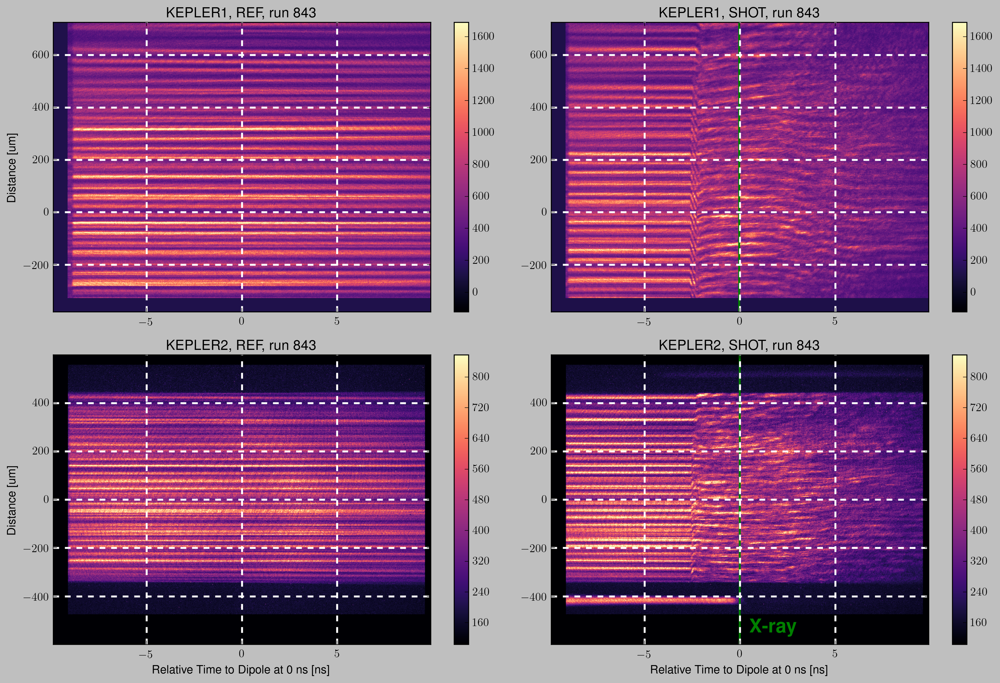

In [11]:
experimentID = '2740'
# runnumber = '166'
# runnumber = np.arange(856, 864, 1)
runnumber = [843]
for r in runnumber:
    processshot(experimentID, r, savefig = False)